<a href="https://colab.research.google.com/github/hochthom/OG-AI4Artists-2023/blob/main/Image-Generation/ai4artists_stable_diffusion_intro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Stable Diffusion Intro** 🎨 
*...using `🧨diffusers`*

This Colab notebook shows how to use Stable Diffusion with the 🤗 Hugging Face [🧨 Diffusers library](https://github.com/huggingface/diffusers). 

Let's get started!

## 1. How to use `StableDiffusionPipeline`



### Setup

First, please make sure you are using a GPU runtime to run this notebook, so inference is much faster. If the following command fails, use the `Runtime` menu above and select `Change runtime type`.

In [ ]:
!nvidia-smi

Wed Apr 19 08:03:09 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Next, you should install `diffusers` as well `scipy`, `ftfy` and `transformers`. `accelerate` is used to achieve much faster loading.

In [ ]:
!pip install diffusers==0.11.1
!pip install transformers scipy ftfy accelerate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.9/524.9 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.1/200.1 kB 4.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 58.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 215.3/215.3 kB 26.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 107.3 MB/s eta 0:00:00


### Stable Diffusion Pipeline

`StableDiffusionPipeline` is an end-to-end inference pipeline that you can use to generate images from text with just a few lines of code.

If you want to ensure the highest possible precision, please make sure to remove `torch_dtype=torch.float16` at the cost of a higher memory usage.

In [ ]:
import torch
from diffusers import StableDiffusionPipeline

#MODEL = "CompVis/stable-diffusion-v1-4"         # 512x512
MODEL = "runwayml/stable-diffusion-v1-5"        # 512x512

pipe = StableDiffusionPipeline.from_pretrained(MODEL, torch_dtype=torch.float16) 

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


Next, let's move the pipeline to GPU to have faster inference.

In [ ]:
pipe = pipe.to("cuda")

And we are ready to generate images:

## 2. Creating Images

  0%|          | 0/50 [00:00<?, ?it/s]

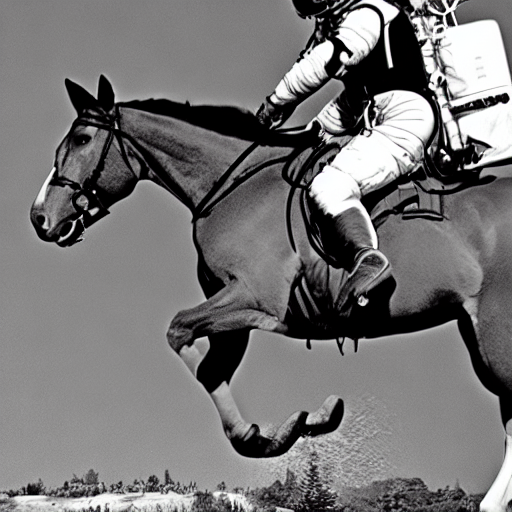

In [ ]:
prompt = "a photograph of an astronaut riding a horse"
image = pipe(prompt).images[0]  # image here is in PIL format

# if you're in a google colab you can directly display it with 
image

Running the above cell multiple times will give you a different image every time. If you want deterministic output you can pass a random seed to the pipeline. Every time you use the same seed you'll have the same image result.

  0%|          | 0/50 [00:00<?, ?it/s]

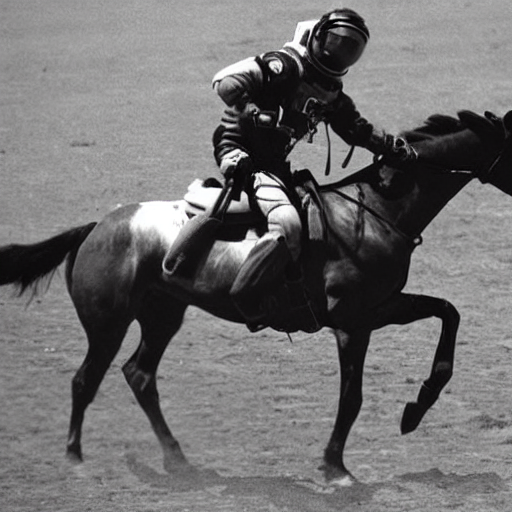

In [ ]:
import torch
generator = torch.Generator("cuda").manual_seed(1024)

image = pipe(prompt, generator=generator).images[0]

image

You can change the number of inference steps using the `num_inference_steps` argument. In general, results are better the more steps you use. Stable Diffusion, being one of the latest models, works great with a relatively small number of steps, so we recommend to use the default of `50`. If you want faster results you can use a smaller number.

  0%|          | 0/15 [00:00<?, ?it/s]

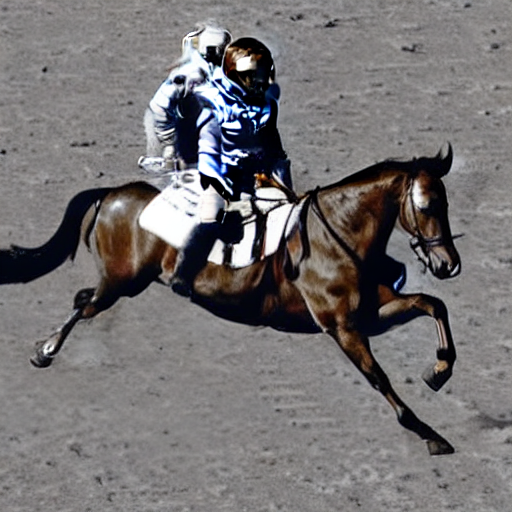

In [ ]:
import torch
generator = torch.Generator("cuda").manual_seed(1024)

image = pipe(prompt, num_inference_steps=15, generator=generator).images[0]

image

### Generate non-square images

Stable Diffusion produces squared images by default. But it's very easy to override the default using the `height` and `width` arguments, so you can create rectangular images in portrait or landscape ratios.

These are some recommendations to choose good image sizes (for a model producing images of size 512x512):
- Make sure `height` and `width` are both multiples of `8`.
- Going below 512 might result in lower quality images.
- Going over 512 in both directions will repeat image areas (global coherence is lost).
- The best way to create non-square images is to use `512` in one dimension, and a value larger than that in the other one.

  0%|          | 0/50 [00:00<?, ?it/s]

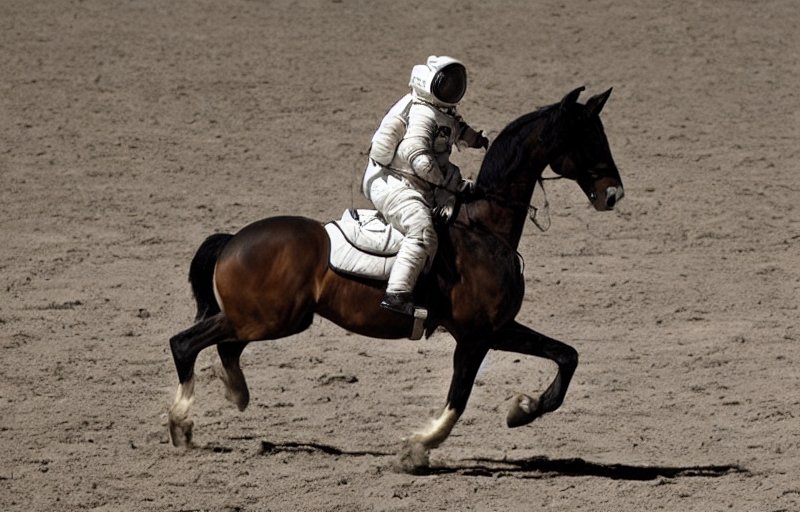

In [ ]:
import torch
generator = torch.Generator("cuda").manual_seed(1024)

image = pipe(prompt, height=512, width=800, generator=generator).images[0]

image

### Generate multiple images



Let's first write a helper function to display a grid of images. Just run the following cell to create the `image_grid` function, or disclose the code if you are interested in how it's done.

In [ ]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

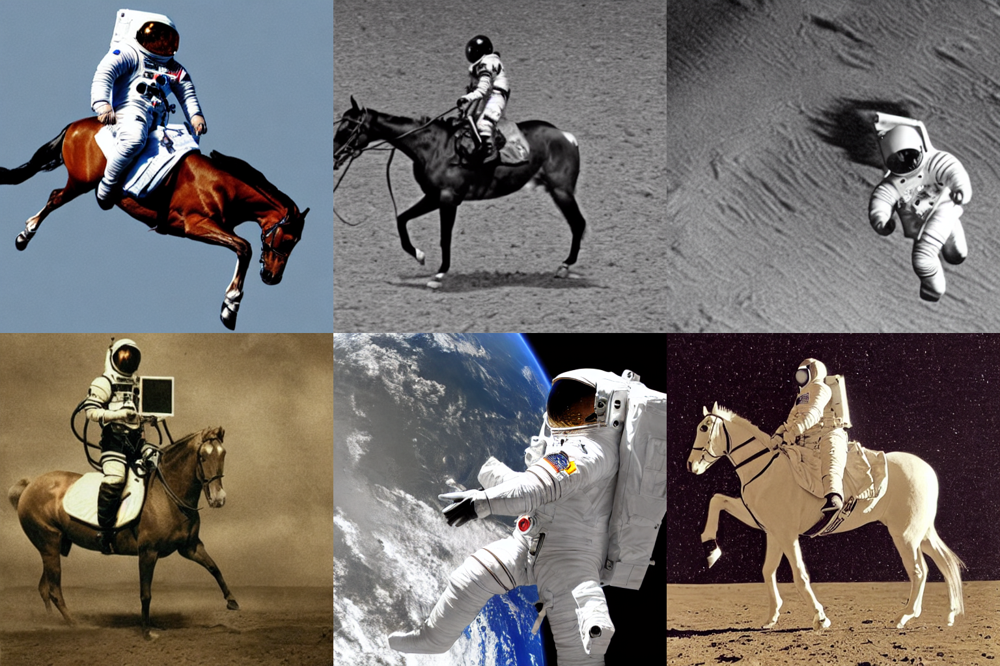

In [ ]:
import torch

num_cols = 3
num_rows = 2

prompt = "a photograph of an astronaut riding a horse"

all_images = []
for i in range(num_rows):
  for j in range(num_cols):
    generator = torch.Generator("cuda").manual_seed(1024 + i*num_cols + j)
    images = pipe(prompt, generator=generator).images
    all_images.extend(images)

grid = image_grid(all_images, rows=num_rows, cols=num_cols)
grid

## Prompt Engineering

Prompts are instructions to Stable Diffusion on how to generate a specific image. The following is a good way to give clear instructions:

> [Adjective] + Subject + Details + Style + [Modifier]


Examples:
* Futuristic cityscape, reflecting sunset, long-exposure photography, 4K
* Abstract geometric pattern, illuminated in neon colors, vector design
* Calm Japanese Zen garden, featuring a koi pond, ink drawing
* Vibrant tropical beach, dotted with palm trees, watercolor painting


Adjectives: 
* Alien, Abstract, Atmospheric, Colorful, Detailed, Dreamy, Elegant, Evil, Flat, Futuristic, Gothic, Majestic, Minimalist, Modern, Mytical, Realistic, Retro, Sleek, Surreal, Tranquil, Vibrant, ...

Style / Modifier: 
* CGI render, concept art, digital art, fantasy art, ink drawing, oil painting, photorealistic, sepia-toned photography, space art, vector design, watercolor painting, ...
* in the style of / by ARTIST (Picasso, ...)
* masterpiece, trending on artstation, high quality, high resolution, detailed, 4K

Hint: Describe what should be in the image, not what is missing.
* Good: A cleanly shaved man
* Bad: A man without a beard

Example:

## Landscapes

In [ ]:
prompt = 'A calm japanese zen garden, featuring a koi pond, long-exposure photography, 4K'

  0%|          | 0/50 [00:00<?, ?it/s]

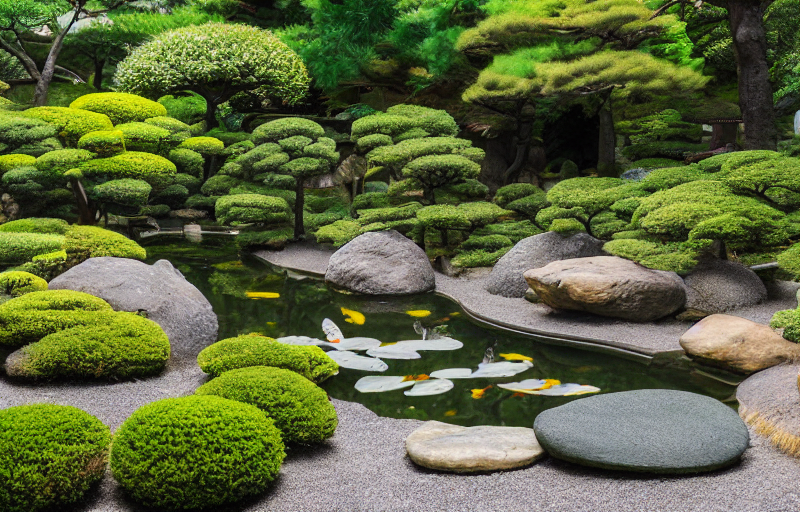

In [ ]:
import torch
generator = torch.Generator("cuda").manual_seed(1024)

image = pipe(prompt, height=512, width=800, generator=generator).images[0]

image

In [ ]:
id = str(hash(prompt))[1:13]
# Now we can save the image such as:
image.save(id + "_sd-gen_image.png")

## Faces and People

In [ ]:
prompt = 'An alluring young woman wearing modern fashionable clothing. '
prompt += 'Oil painting. Highly detailed. Realistic. '
prompt += 'By Steve Henderson, Anna Rose Bain, Emerico Emre Toth, Guillaume Seignac'

  0%|          | 0/50 [00:00<?, ?it/s]

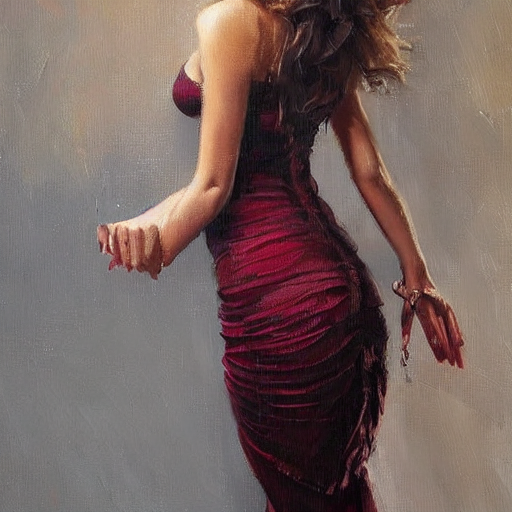

In [ ]:
import torch
generator = torch.Generator("cuda").manual_seed(1024)

image = pipe(prompt, num_inference_steps=50, generator=generator).images[0]

image

### Negative prompts

A negative prompt allow to specify what we don't want to see in the generate image by Stable Diffusion. Here are some examples for negative prompts that can be used togehter to improve the image generation process:

    bad anatomy
    bad proportions
    blurry
    cloned face
    cropped
    deformed
    dehydrated
    disfigured
    duplicate
    error
    extra arms
    extra fingers
    extra legs
    extra limbs
    fused fingers
    gross proportions
    jpeg artifacts
    long neck
    low quality
    lowres
    malformed limbs
    missing arms
    missing legs
    morbid
    mutated hands
    mutation
    mutilated
    out of frame
    poorly drawn face
    poorly drawn hands
    signature
    text
    too many fingers
    ugly
    username
    watermark
    worst quality


In [ ]:
neg = "ugly, worst quality, out of frame, disfigured, too many fingers"

In [ ]:
neg = "out of frame, extra fingers, mutated hands, ((poorly drawn hands)), "
neg += "((poorly drawn face)), (((mutation))), (((deformed))), ((ugly)), blurry, "
neg += "(((bad proportions))), ((extra limbs)), cloned face, (((disfigured))), "
neg += "out of frame, ugly, extra limbs, (bad anatomy), gross proportions, "
neg += "(malformed limbs), ((missing arms)), ((missing legs)), (((extra arms))), "
neg += "(((extra legs))), (fused fingers), (too many fingers), (((long neck)))"

  0%|          | 0/50 [00:00<?, ?it/s]

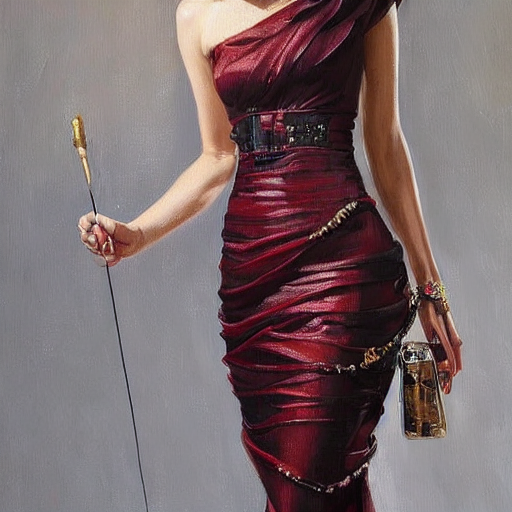

In [ ]:
import torch
generator = torch.Generator("cuda").manual_seed(1024)

image = pipe(prompt, negative_prompt=neg, num_inference_steps=50, generator=generator).images[0]

image

In [ ]:
id = str(hash(prompt))[1:13]
# Now we can save the image such as:
image.save(id + "_sd-gen_image.png")

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


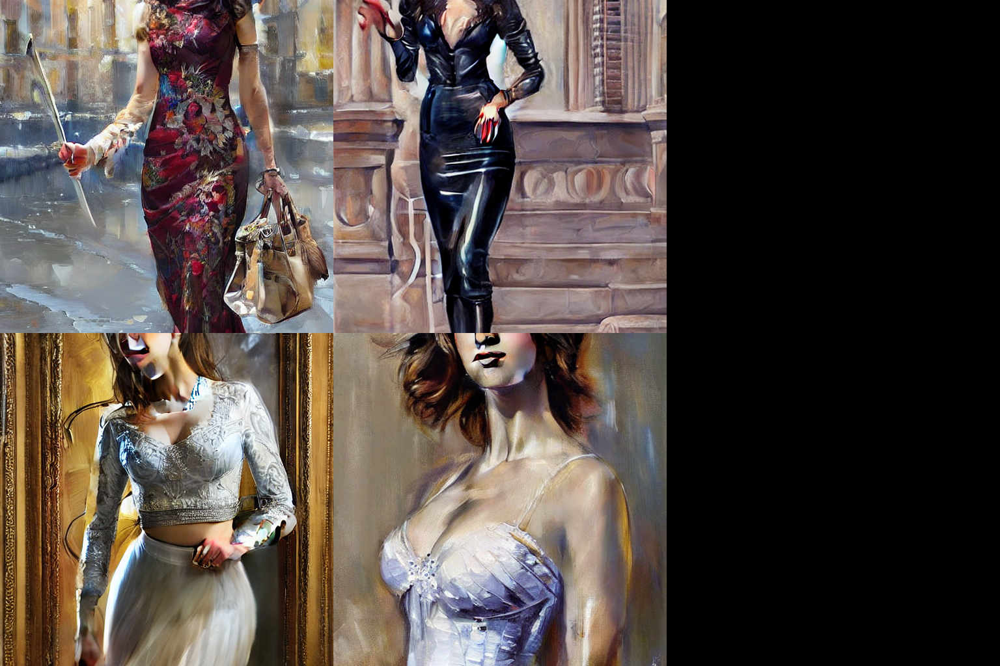

In [ ]:
import torch

num_cols = 3
num_rows = 2

all_images = []
for i in range(num_rows):
  for j in range(num_cols):
    generator = torch.Generator("cuda").manual_seed(1024 + i*num_cols + j)
    images = pipe(prompt, negative_prompt=neg, num_inference_steps=10, generator=generator).images
    all_images.extend(images)

grid = image_grid(all_images, rows=num_rows, cols=num_cols)
grid

# ControlNet

see other Colab

# Cheatsheet

### Adjectives:
adorable, aggressive, alien, ancient, angelic, angry, anxious, athletic, award-winning, basic, beautiful, chaotic, cheerful, clean, cold, colorful, confusing, cozy, creepy, cute, depressing, detailed, dirty, disgusting, dreamy, dry, ecstatic, elderly, ethereal, evil, excited, expensive, fancy, fat, flat, fluffy, friendly, furry, fuzzy, gloomy, good, gorgeous, greeble, hairy, handsome, happy, healthy, huge, hyperrealistic, impossible, incoherent, intricate, joyful, large, lonely, lucid, luminous, massive, mature, mellow, micro, mini, minimalist, moody, morbid, mottled, muted, nano, nervous, old, old-fashioned, ornate, otherworldly, outstanding, photorealistic, plain, powerful, pretty, priceless, psychedelic, quiet, rainy, realistic, refreshing, sad, simple, sinister, sleepy, smooth, spooky, strong, talented,tame, tasty, tense, terrible, thankful, thoughtful, thoughtless, tired, tough, troubled, ugly, uninterested, unusual, upset, uptight, vast, victorious, vivacious, weary, wicked, wild, witty, worrisome, zany, zealous

### Lighting: 
accent lighting, afternoon, artifical lighting, backlighting, beautiful lighting, blue hour, bright lighting, lit by candlelight, Christmas lights, cinematic lighting, colorful lighting, contre-jour, crepuscular rays, dark lighting, dawn, daylight, daytime, dim lighting, dramatic lighting, dusk, evening, film noir lighting, lit by firelight, flickering light, floodlight, fluorescent light, front lighting, global illumination, golden hour, halfrear lighting, halogen light, hard lighting, high key lighting, incandescent light, low key lighting, low lighting, moody lighting, morning, natural lighting, nighttime, noon, portrait lighting, ray tracing, ray tracing global illumination, rays of light, rays of shimmering light, realistic lighting, Rembrandt lighting, rim lighting, silhouette lighting, soft lighting, split lighting, spotlight, studio lighting, sunlight, sunrise, sunset, twilight, ultraviolet light, volumetric lighting, Xray

### Time periods: 
ancient Egypt, ancient Greece, ancient Rome, antique, Assyrian Empire, Aztec, Babylonian Empire, Benin Kingdom, Bronze Age, Byzantine Empire, Carolingian, Dark Ages, Edwardian, Elizabethan, Georgian, Gilded Age, Great Depression, Heian Period, Incan, Industrial Revolution, Iron Age, Maori, Mayan, medieval, Meiji Period, midcentury, Middle Ages, Ming Dynasty, Minoan, modern, Moorish, Mughal Era, Nasrid, Navajo, Neolithic, Olmec, Ottoman Empire, Paleolithic, Persian Empire, pre-Columbian, prehistoric, Qing Dynasty, Regency, Renaissance, retro, Shang Dynasty, Songhai, Stone Age, Sumerian, Tokugawa Shogunate, Tudor, Victorian, Viking, World War I, World War II, Zhou Dynasty, Zuni-Pueblo, 1100s, etc.

### Decorative Art: 
3D print, amigurumi, applique, balloon modelling, balloon twisting, bas-relief, beadwork, blown glass, bone china, carved, carved ivory, carved lacquer, carving, chip-carving, claymation, cloisonne, crochet, cross stitch, diorama, embroidery, enameling, felting, fretwork, glass mosaic, ice-carving, impressionist mosaic, inlaid, intarsia, jigsaw puzzle, crochet, lacquer, lampwork, latte art, leather carving, leatherwork, marble, marquetry, micromosaic, miniature painting, modular origami, mosaic, needlework, origami, paper model, papercutting, papier-mache, photographic mosaic, Pietra dura, porcelain, pottery, puppet, puzzle, pysanky, quillwork, quilted, relief-carving, repousse, rigid origami, sand art, scrimshaw, sculpture, stained glass, statue, string-art, tapestry, tattoo, tattoo art, Venetian glass, weaving, wet-folding, whittling, wood-burning

### Rendering techniques: 
3D model, 3ds Max, 500px, Arnold render, ArtStation, Blender Render, CGsociety, Cinema4D Render, CryEngine, Cycles Render, Daz 3D, DeviantArt, DirectX Render, Doughy Render, Houdini Render, Infini-D Render, KitBash3D, Luxcore Render, Marvelous Designer, MentalRay Render, OctaneRender, Optix Render, Photobashed, Photoshop, physically based render, Pixia, Quixel Megascans, Raylectron Render, Redshift Render, Sketchfab, Substance 3D, Terragen, Unreal Engine, Vray Render, Weta Digital, Zbrush Render

### Photography Styles: 
daguerreotype, tintype, film negative, Tri-X, Kodachrome, slide film, portra 800, Natura 1600, ilford delta 3200, polaroid, hasselblad, double exposure, multiple exposure, large format camera, wide angle lens, fisheye lens, tilt shift lens, anamorphic, lensbaby, telephoto, prime lens, f1.8, f2.8, f4, f11, f16, photoshoot, commercial, thermographic, x-ray, infrared

### Print Styles: 
Advertisement, Aquatint, Banner, Barcode, Block printing, Blueprint, Booklet, Business card, Collage, Coloring book, Comic book, Cyanotype, Election photo, Election poster, Etching, Graphic novel, Halftone, illuminated manuscript, illustrated-booklet, instruction manual, intaglio, Iinocut, Lithograph, Logo, Magazine, “Magic the Gathering” card, Manuscript, Map, Mezzotint, Mono printing, Movie poster, Newspaper, Newsprint, Photocollage, Photograph, Postage stamp, Poster, Product photo, Propaganda Poster, QR code, Schematic, Signage, Silver gelatin, Sticker, Storyboard, Storybook illustration, Tarot card, Visual novel, Wall decal, Woodblock print.

### Art styles: 
Abstract, Abstract expressionism, Academism, Action painting, American realism, Analytical cubism, Anime, Art Deco, Art Nouveau, Baroque, Bauhaus, Biopunk, Color Field painting, Classical realism, Conceptual art, Cubism, Cybernoir, Cyberpunk, Dada, Dark fantasy, De Stijl, Decopunk, Dieselpunk, Digital art, Expressionism, Fauvism, Futurism, Fine art, Futurism, Gothic, Impressionism, Installation art, Land art, Lyrical Abstraction, Manga, Modern art, Minimalism, Modernism, Neo-Dada, Neo-expressionism, Neoclassical, Neo-Impressionism, New realism, Nouveau Realisme, Op Art, Orphism, Photorealism, Pixel art,  Pop art, Post-Impressionism, Post-minimalism, Post-painterly abstraction, Precisionism, Purism, Realism, Rococo, Romanticism, Socialist realism, Steampunk, Surrealism, Synthwave, Surrealism, Symbolism, Synchromism, Tonalism, Ukiyo-e, Video art, and Zouave.